In [56]:
import os
from pathlib import Path
from PIL import Image, ImageDraw
import numpy as np
import pandas as pd
import csv

## Dataset Format

- `gt.txt`: Ground truth annotations. CSV file where each row contains: Frame number, person ID, x, y, width, height

### Plotting one example annotation

In [13]:
DATASET_DIR = Path('..\..\datasets\Cornell\sompt22')
assert DATASET_DIR.exists() and DATASET_DIR.is_dir(), f'{DATASET_DIR} does not exist'

In [31]:
first_scene_fp = DATASET_DIR / 'train' / 'SOMPT22-07'
first_image_fp = first_scene_fp / 'img1' / '000001.jpg'

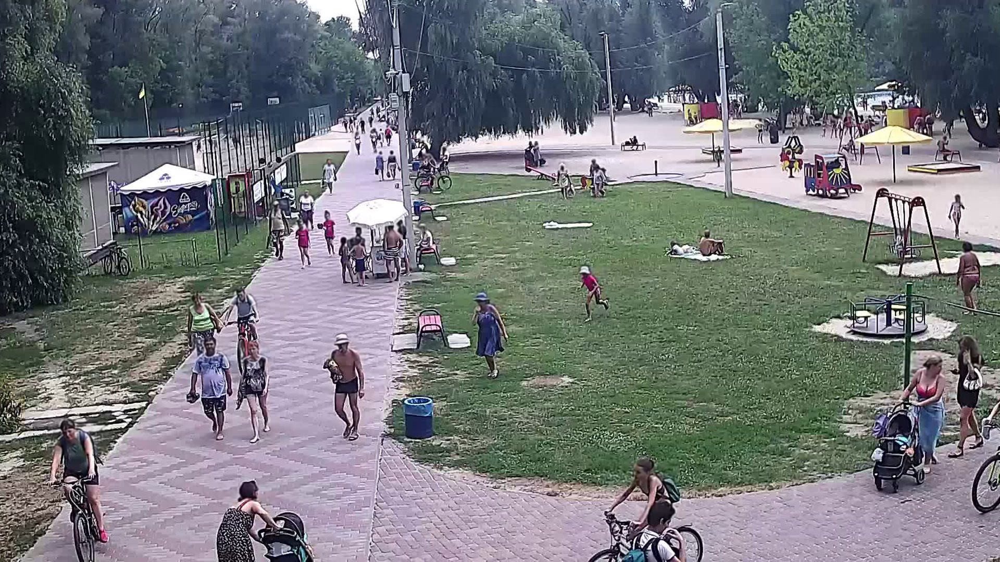

In [33]:
first_image = Image.open(first_image_fp)
first_image

In [58]:
first_gt_fp = first_scene_fp / 'gt' / 'gt.txt'
with open(first_gt_fp, 'r') as gt_f:
    reader = csv.reader(gt_f)
    first_gts = list(reader)
len(first_gts)

82525

In [67]:
frame, id, x, y, width, height, *_ = first_gts[0]
x = int(x)
y = int(y)
width = int(width)
height = int(height)

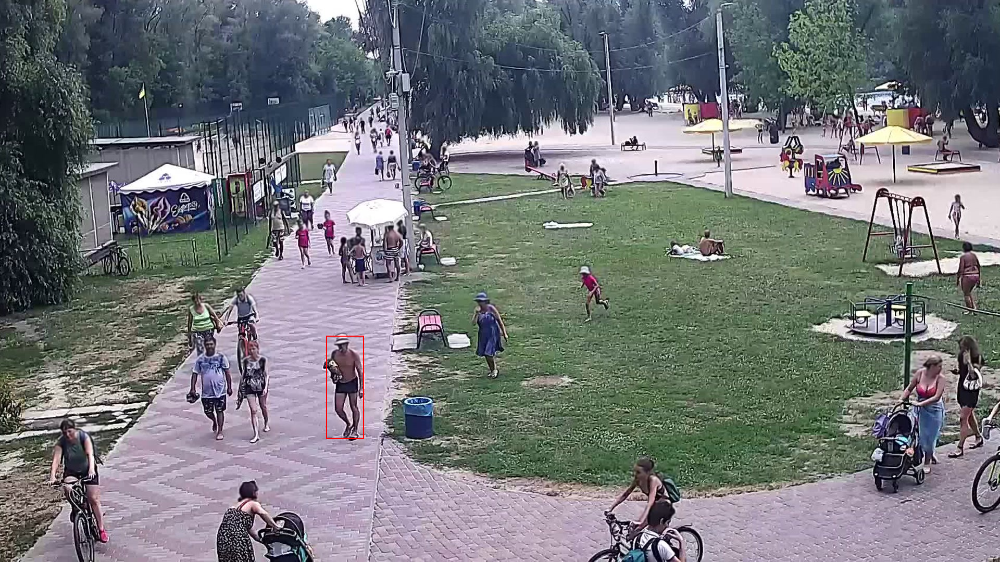

In [66]:
first_image = Image.open(first_image_fp)
first_bbox = ImageDraw.Draw(first_image)
first_bbox.rectangle([(x, y), (x + width, y + height)], outline='red', width=2)
display(first_image)

### Writing generalized code to render scenes

In [170]:
from collections import defaultdict
from pydantic import BaseModel

class ImageAnnotation(BaseModel):
    frame: int
    person_id: int
    x: int
    y: int
    width: int
    height: int

    def as_coordinates(self):
        return self.x, self.y, self.x + self.width, self.y + self.height
    
    def center_top(self):
        return self.x + self.width / 2, self.y + self.height / 2

class SomptImage:

    def __init__(self, scene: 'SomptScene', frame: int) -> None:
        self._scene = scene
        self._frame = frame
        self._fp = self._scene._image_dir / f'{str(frame).zfill(6)}.jpg'
        assert self._fp.exists() and self._fp.is_file(), \
            f'{self._fp} does not exist'

    def image(self) -> Image:
        return Image.open(self._fp)
    
    def render(self):
        img = self.image()
        draw = ImageDraw.Draw(img)
        for anno in self._scene.get_annotations(self._frame):
            draw.rectangle(anno.as_coordinates(), outline='red', width=2)
            # draw.text(anno.center_top(), str(anno.person_id), fill='red', font=)
        return img
        
class SomptScene:
    def __init__(self, number: str, train: bool = True) -> None:
        self._dir = DATASET_DIR / ('train' if train else 'test') / f'SOMPT22-{number}'
        assert self._dir.exists() and self._dir.is_dir(), \
            f'Cannot find scene "{number}"'
        
        annotations: dict[str, list[ImageAnnotation]] = defaultdict(list)
        with open(self._annotation_fp, 'r') as gt_f:
            reader = csv.DictReader(gt_f, fieldnames=list(ImageAnnotation.model_fields))
            for row in reader:
                row.pop(None)   # Remove extraneous fields
                annotations[int(row['frame'])].append(ImageAnnotation(**row))
        self._annotations = dict(annotations)   # defaultdict can lead to hard to catch bugs

    @property
    def _image_dir(self) -> Path:
        return self._dir / 'img1'
    
    @property
    def _annotation_fp(self) -> Path:
        return self._dir / 'gt' / 'gt.txt'

    def __len__(self) -> int:
        return len(list(self._image_dir.glob('*.jpg')))
    
    def get_frame(self, number: int) -> SomptImage:
        assert 0 < number <= len(self), f'Invalid index, must be between 1 and {len(self)}'
        return SomptImage(self, number)
    
    def get_annotations(self, number: int) -> list[ImageAnnotation]:
        assert 0 < number <= len(self), f'Invalid index, must be between 1 and {len(self)}'
        return self._annotations[number]


In [171]:
scene = SomptScene('07')
len(scene)

1800

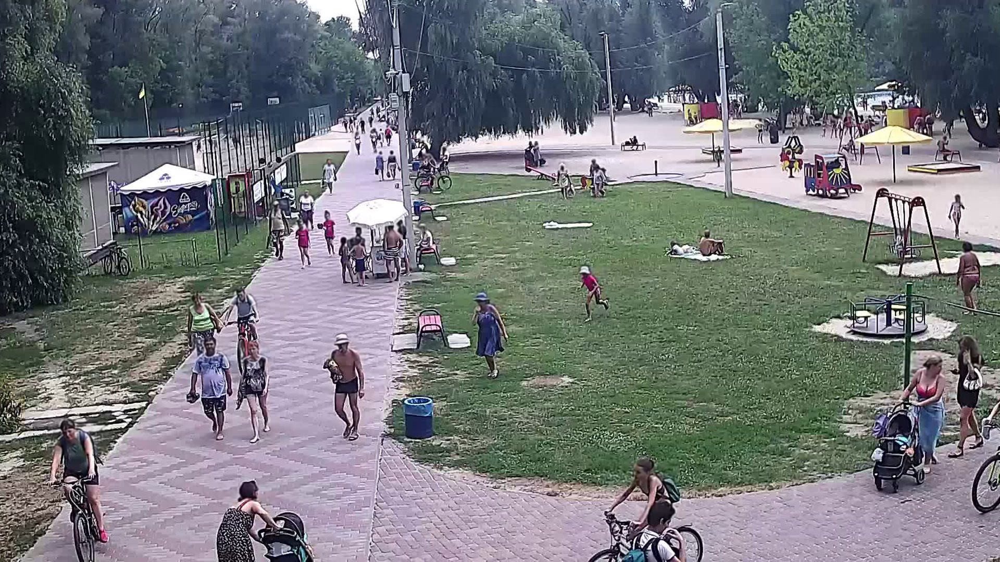

In [172]:
scene.get_frame(1).image()

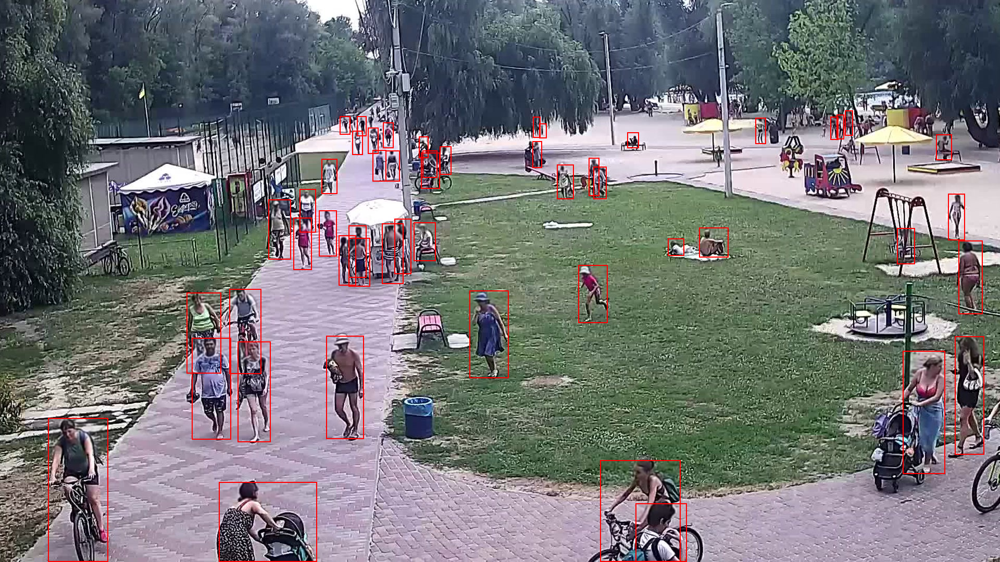

In [173]:
scene.get_frame(1).render()